In [1]:
import torch
import matplotlib.pyplot as plt 
import numpy as np 

import torchvision
from torchvision import datasets, transforms

import torch.nn as nn
import torch.optim as optim 
import seaborn as sns

In [2]:
import mlflow
import mlflow.pytorch

## Params

In [3]:
class Params(object):
    def __init__(self, batch_size, epochs, seed, log_interval):
        self.batch_size = batch_size
        self.epochs = epochs
        self.seed = seed
        self.log_interval = log_interval

args = Params(256, 1, 0, 20)

In [4]:
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.1307,),(0.3081,))
])
train_set = datasets.MNIST('../data',train=True, download=True, transform=transform)
test_set = datasets.MNIST('../data', train=False, download=True, transform=transform)

train_loader = torch.utils.data.DataLoader(train_set, batch_size=args.batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_set, batch_size=args.batch_size, shuffle=False)

## Model

In [5]:
class Model(nn.Module):
    def __init__(self, nH = 32):
        super(Model, self).__init__()
        self.classifier = nn.Sequential(
            nn.Linear(784, nH),
            nn.ReLU(),
            nn.Linear(nH, 10)
        )
    
    def forward(self, x):
        x = x.view(x.size(0), -1)
        x = self.classifier(x)
        return x

In [6]:
def train(epoch):
    model.train()

    for batch_id, data in enumerate(train_loader):
        inputs, labels = data

        opt.zero_grad()
        outputs = model(inputs)
        loss = loss_fn(outputs, labels)
        loss.backward()
        opt.step()

        if batch_id % args.log_interval == 0:
            pos = epoch * len(train_loader) + batch_id
            mlflow.log_metric('trainloss', loss.data.item()/len(inputs)*1000)
            print('Train Epoch: {} [{}/{} ({:.0f}%)]\tLoss: {:.3f}'.format(
                epoch, batch_id*len(inputs), len(train_loader.dataset), 100.*batch_id/len(train_loader), loss.data.item()
            ))
            

In [7]:
def test(epoch):

    model.eval()
    test_loss = 0 
    correct = 0
    confusion_matrix = np.zeros([10, 10])

    with torch.no_grad():
        for inputs, labels in test_loader:
            outputs = model(inputs)
            test_loss += loss_fn(outputs, labels).data.item()
            pred = outputs.data.max(1)[1]
            correct += pred.eq(labels.data).sum().item()

            for x,y in zip(pred.numpy(), labels.numpy()):
                confusion_matrix[x][y] += 1
        
        test_loss /= len(test_loader.dataset)
        test_accuracy = 100.0 * correct / len(test_loader.dataset)

        pos = (epoch + 1) * len(train_loader)
        mlflow.log_metric('test_loss', test_loss*1000)
        mlflow.log_metric('test_accuracy', test_accuracy)

        print('\nTest set: Average loss: {:.4f}, Accuracy: {}/{} ( {:.0f}%)\n'.format(test_loss, correct, len(test_loader.dataset),test_accuracy))

        if epoch == args.epochs:
            classes = np.arange(10)
            fig, ax = plt.subplots()
            im = ax.imshow(confusion_matrix, interpolation='nearest',cmap=plt.cm.Blues)
            ax.figure.colorbar(im, ax=ax)
            ax.set(xticks = np.arange(confusion_matrix.shape[1]),
            yticks=np.arange(confusion_matrix.shape[0]),
            xticklabels = classes,
            yticklabels = classes, 
            ylabel='True Label',
            xlabel='Predicted label',
            title='Epoch %d' % epoch)
            thresh = confusion_matrix.max() / 2.
            for i in range(confusion_matrix.shape[0]):
                for j in range(confusion_matrix.shape[1]):
                    ax.text(j, i, int(confusion_matrix[i, j]),
                    ha="center", va="center", color="white" if confusion_matrix[i, j] > thresh else "black")
            
            fig.tight_layout()
            print(expt_id)
            image_path = expt_id+'.png'

            plt.savefig(image_path)
            mlflow.log_artifact(image_path)


## Hyperparameter tuning loop


LR = 0.01, Momentum = 0.90, Hidden nodes = 48

Train Epoch: 1 [0/60000 (0%)]	Loss: 2.309
Train Epoch: 1 [5120/60000 (9%)]	Loss: 0.976
Train Epoch: 1 [10240/60000 (17%)]	Loss: 0.478
Train Epoch: 1 [15360/60000 (26%)]	Loss: 0.363
Train Epoch: 1 [20480/60000 (34%)]	Loss: 0.349
Train Epoch: 1 [25600/60000 (43%)]	Loss: 0.269
Train Epoch: 1 [30720/60000 (51%)]	Loss: 0.254
Train Epoch: 1 [35840/60000 (60%)]	Loss: 0.302
Train Epoch: 1 [40960/60000 (68%)]	Loss: 0.315
Train Epoch: 1 [46080/60000 (77%)]	Loss: 0.215
Train Epoch: 1 [51200/60000 (85%)]	Loss: 0.294
Train Epoch: 1 [56320/60000 (94%)]	Loss: 0.301

Test set: Average loss: 0.0010, Accuracy: 9262/10000 ( 93%)

1_90_48

LR = 0.01, Momentum = 0.95, Hidden nodes = 48

Train Epoch: 1 [0/60000 (0%)]	Loss: 2.303
Train Epoch: 1 [5120/60000 (9%)]	Loss: 0.714
Train Epoch: 1 [10240/60000 (17%)]	Loss: 0.475
Train Epoch: 1 [15360/60000 (26%)]	Loss: 0.485
Train Epoch: 1 [20480/60000 (34%)]	Loss: 0.347
Train Epoch: 1 [25600/60000 (43%)]	Loss: 0.323
Tr

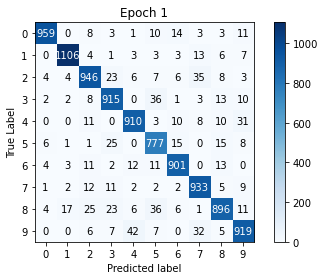

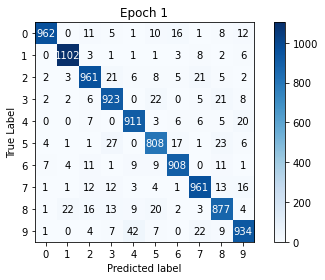

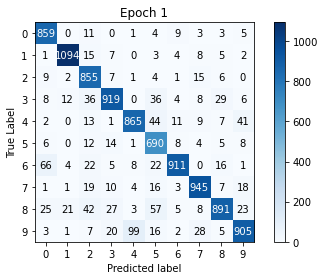

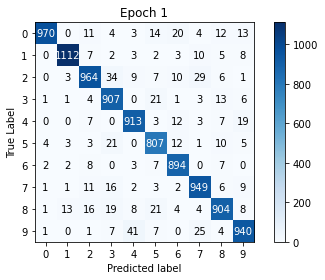

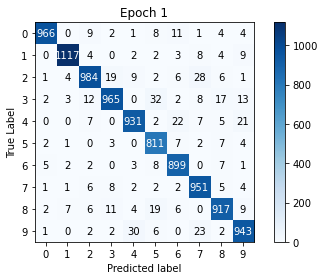

...

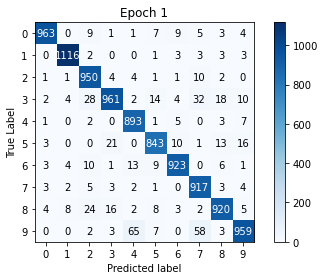

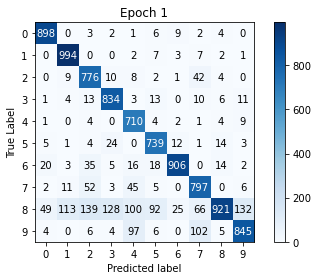

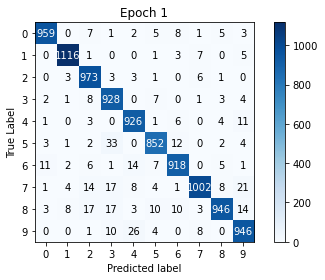

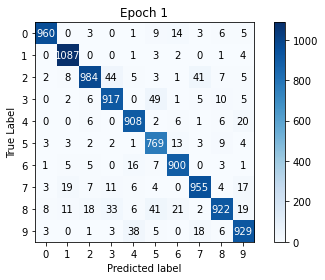

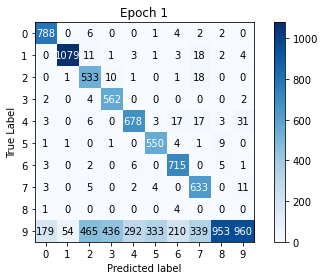

In [8]:
expt_id = mlflow.create_experiment('Fixed nH')
mlflow.set_experiment('Fixed nH')

for lr in [0.01, 0.02, 0.05, 0.1]:
    for momentum in [0.9, 0.95, 0.99]:
        for hidden_nodes in [48]:
        
            expt_id = '%d_%d_%d' % (int(lr*100), int(momentum*100), hidden_nodes)

            print('\nLR = %.2f, Momentum = %.2f, Hidden nodes = %d\n' % (lr, momentum, hidden_nodes))

            model = Model(hidden_nodes)

            loss_fn = nn.CrossEntropyLoss()
            opt = optim.SGD(model.parameters(), lr=lr, momentum = momentum)

            with mlflow.start_run() as run:  
                for key, value in vars(args).items():
                    mlflow.log_param(key, value)
                mlflow.log_param('lr', lr)
                mlflow.log_param('momentum', momentum)
                mlflow.log_param('hidden_nodes', hidden_nodes)

                for epoch in range(1, args.epochs + 1):
                    train(epoch)
                    test(epoch)

                mlflow.pytorch.log_model(model, "models")

# Loading and visualising a model

In [25]:
model_load = mlflow.pytorch.load_model('mlruns/1/56cc740f0c024ff896d4d0fa06de0f5d/artifacts/models'
)

In [26]:
print(model_load)

Model(
  (classifier): Sequential(
    (0): Linear(in_features=784, out_features=48, bias=True)
    (1): ReLU()
    (2): Linear(in_features=48, out_features=10, bias=True)
  )
)


In [27]:
weight_layer0 = list(model_load.parameters())[0].data.numpy()

In [28]:
print(weight_layer0.shape)

(48, 784)


[]

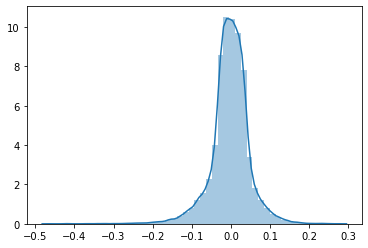

In [29]:
sns.distplot(weight_layer0.ravel())
plt.plot()

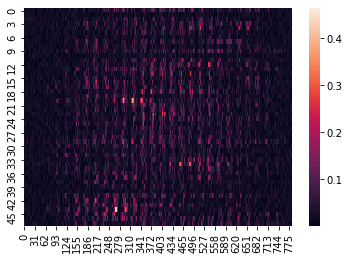

In [30]:
sns.heatmap(np.abs(weight_layer0))
plt.show()

In [31]:
weight_layer1 = list(model_load.parameters())[2].data.numpy()

In [32]:
weight_layer1.shape

(10, 48)

[]

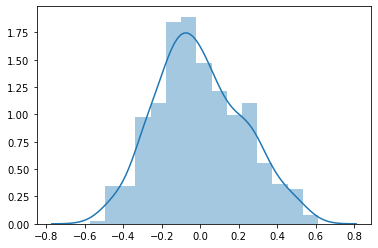

In [33]:
sns.distplot(weight_layer1.ravel())
plt.plot()

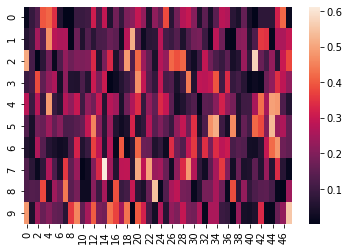

In [34]:
sns.heatmap(np.abs(weight_layer1))
plt.show()

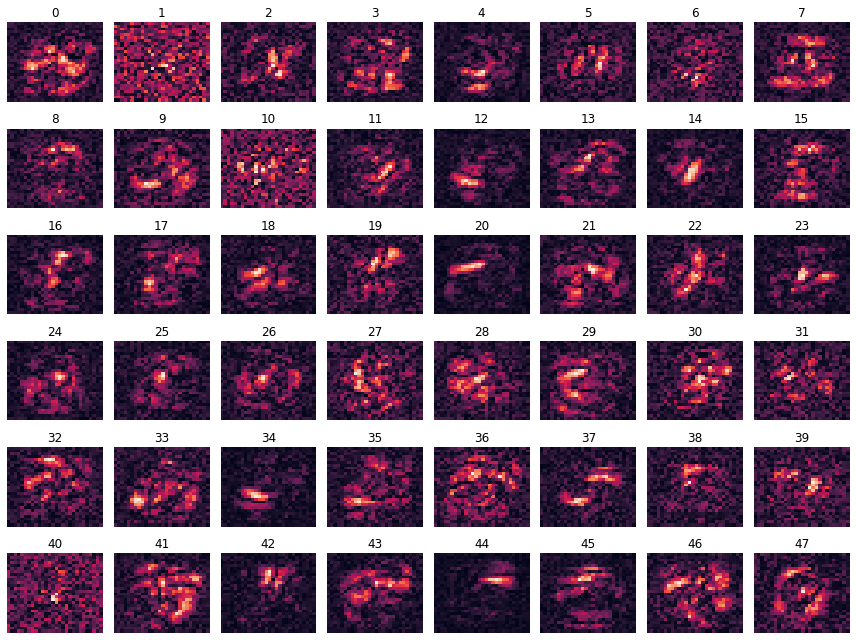

In [35]:
nrows = 6
ncols = 8
fig = plt.figure(figsize=(1.5*ncols, 1.5*nrows))

for i in np.arange(48): 
    ax1 = fig.add_subplot(nrows, ncols, i+1)
    sns.heatmap(np.abs((weight_layer0[i, 0:784]).reshape(28, 28)), ax = ax1, cbar=False)
    ax1.axis('off')
    ax1.set_xticklabels([])
    ax1.set_yticklabels([])
    ax1.set_title(i)
plt.tight_layout()
plt.show()